In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imagenette2/imagenette2/noisy_imagenette.csv
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_8421.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_4681.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_29670.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_6380.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_14790.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_4490.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_8580.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_32420.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_12111.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_8572.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_27451.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_3782.JPEG
/kaggle/input/imagenette2/imagenette2/val/n01440764/n01440764_622.JPEG
/

In [2]:
import torch
import torch.nn as nn
import numpy as np
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from torchmetrics import Accuracy
from tqdm import tqdm

In [3]:
BATCH_SIZE = 4
gen_lr = 0.001
dis_lr = 0.001
noise_factor = 0.5
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
def noise_generate(img, t, device, width=224, height=224, max_dustance=torch.norm(torch.ones((3, 224, 224), dtype=torch.float32) * 255)):
    d = t * max_distance
    norm_img = torch.norm(img)
    random_tensor = torch.randn(3, 224, 224).to(device)
    normalized_random_tensor = random_tensor / torch.norm(random_tensor)
    new_tensor = img + d * normalized_random_tensor * norm_img
    return new_tensor

In [5]:
class vgg16(nn.Module):
    def __init__(self):
        super(vgg16, self).__init__()
        self.conv1_1 = nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size = 3, stride = 1, padding = 1)
        self.relu1_1 = nn.ReLU()
        self.conv1_2 = nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, stride = 1, padding = 1)
        self.relu1_2 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size = 2, stride = 2)
        #64x128x128 to _ or 3x224x224 to 64x112x122
        self.conv2_1 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride = 1, padding = 1)
        self.relu2_1 = nn.ReLU()
        self.conv2_2 = nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, stride = 1, padding = 1)
        self.relu2_2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size = 2, stride = 2)
        #128x64x64 to _ or 64x112x112 to 128x56x56
        self.conv3_1 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride = 1, padding = 1)
        self.relu3_1 = nn.ReLU()
        self.conv3_2 = nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, stride = 1, padding = 1)
        self.relu3_2 = nn.ReLU()
        self.conv3_3 = nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, stride = 1, padding = 1)
        self.relu3_3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size = 2, stride = 2)
        #256x32x32 to _ or 128x56x56 to 256x28x28
        self.conv4_1 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, stride = 1, padding = 1)
        self.relu4_1 = nn.ReLU()
        self.conv4_2 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, stride = 1, padding = 1)
        self.relu4_2 = nn.ReLU()
        self.conv4_3 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, stride = 1, padding = 1)
        self.relu4_3 = nn.ReLU()
        self.pool4 = nn.MaxPool2d(kernel_size = 2, stride = 2)
        #512x16x16 to _ or 256x28x28 to 512x14x14
        self.conv5_1 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, stride = 1, padding = 1)
        self.relu5_1 = nn.ReLU()
        self.conv5_2 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, stride = 1, padding = 1)
        self.relu5_2 = nn.ReLU()
        self.conv5_3 = nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, stride = 1, padding = 1)
        self.relu5_3 = nn.ReLU()
        self.pool5 = nn.MaxPool2d(kernel_size = 2, stride = 2)
        #512x8x8 to _ or 512x14x14 to 512x7x7
        self.classifier = nn.Sequential(
            nn.Linear(512*7*7, 4096),
            #nn.Linear(4096, 4096),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(4096, 1000),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1000, 10)
        )
        self.softmax = nn.Softmax(dim=1)
        
    def forward(self, x):
        x = self.conv1_1(x)
        x = self.relu1_1(x)
        conv1_1_fm = x
        x = self.conv1_2(x)
        x = self.relu1_1(x)
        conv1_2_fm = x
        x = self.pool1(x)
        x = self.conv2_1(x)
        x = self.relu2_1(x)
        x = self.conv2_2(x)
        x = self.relu2_2(x)
        x = self.pool2(x)
        x = self.conv3_1(x)
        x = self.relu3_1(x)
        x = self.conv3_2(x)
        x = self.relu3_2(x)
        x = self.conv3_3(x)
        x = self.relu3_3(x)
        x = self.pool3(x)
        x = self.conv4_1(x)
        x = self.relu4_1(x)
        x = self.conv4_2(x)
        x = self.relu4_2(x)
        x = self.conv4_3(x)
        x = self.relu4_3(x)
        x = self.pool4(x)
        x = self.conv5_1(x)
        x = self.relu5_1(x)
        conv5_1_fm = x
        x = self.conv5_2(x)
        x = self.relu5_2(x)
        conv5_2_fm = x
        x = self.conv5_3(x)
        x = self.relu5_3(x)
        conv5_3_fm = x
        x = self.pool5(x)
        x = x.view(x.size(0), -1)
        fc_latent_v = x
        x = self.classifier(x)
        return [x, fc_latent_v,conv5_1_fm, conv5_2_fm, conv5_3_fm, conv1_1_fm, conv1_2_fm]

In [6]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size = 3, stride = 2, padding = 1),
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.Tanh()
        )  
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [7]:
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2, inplace=True), 
        )
        
    def forward_once(self, input):
        output = self.encoder(input)
        output = output.view(output.size(0), -1)
        return output
    
    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2 

In [8]:
data_path = '/kaggle/input/imagenette2/imagenette2/train'

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_dataset = ImageFolder(root=data_path, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [9]:
toPIL = transforms.ToPILImage()

In [42]:
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=3.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin
        
    def forward(self, input1, input2, y):
        diff = input1 - input2
        dist_sq = torch.sum(torch.pow(diff, 2), 1)
        dist = torch.sqrt(dist_sq)
        mdist = self.margin - dist
        dist = torch.clamp(mdist, min=0.0)
        loss = y * dist_sq + (1 - y) * torch.pow(dist, 2)
        loss = torch.sum(loss) / 2.0 / input1.size()[0]
        return loss

In [43]:
class SemanticLoss(torch.nn.Module):
    def __init__(self):
        super(SemanticLoss, self).__init__()
        
    def forward(self, original_image_feature_maps, generated_image_feature_maps, original_image, generated_image):
        CL = torch.mean(torch.norm(original_image_feature_maps[2] - generated_image_feature_maps[2], dim = 1))
        CL += torch.mean(torch.norm(original_image_feature_maps[3] - generated_image_feature_maps[3], dim = 1))
        CL += torch.mean(torch.norm(original_image_feature_maps[4] - generated_image_feature_maps[4], dim = 1))
        
        v1 = original_image_feature_maps[1]
        v2 = generated_image_feature_maps[1]
        
        KL = F.kl_div(F.log_softmax(v1[0],dim = 0), F.softmax(v2[0], dim = 0))
        KL += F.kl_div(F.log_softmax(v2[0],dim = 0), F.softmax(v1[0], dim = 0))
        
        loss = (KL * 100000) + CL
        return loss

In [62]:
PATH = "/kaggle/input/pretrained-classifier/model_clf.pth"
model_clf = vgg16()
model_clf = model_clf.to(device)
model_clf.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [45]:
Discriminator_loss =  ContrastiveLoss()
Generator_loss = SemanticLoss()

In [46]:
def plot_images(images, title):
    images = make_grid(images, nrow=4).permute(1, 2, 0).numpy()
    plt.figure(figsize=(15, 15))  # Adjusted figure size
    plt.imshow(images)
    plt.title(title)
    plt.axis("off")
    plt.show()

In [47]:
def matching_accuracy(original_image_output, generated_image_output):
    with torch.no_grad():
        o_pred = torch.argmax(original_image_output, dim=1)
        g_pred = torch.argmax(generated_image_output, dim=1)
        correct = o_pred.eq(g_pred).sum().item()
        acc = correct / len(o_pred)
    return acc

In [63]:
netD = SiameseNetwork().to(device)
netG = Generator().to(device)

In [64]:
optimizerD = optim.SGD(netD.parameters(), lr= dis_lr)
optimizerG = optim.Adam(netG.parameters(), lr= gen_lr, betas=(0.5, 0.999))

In [50]:
#Training loop
noise_factor = 5
match_acc = 0
gen_train_loss = 0
disc_train_loss = 0
for epoch in tqdm(range(10)):
    for i, data in enumerate(train_dataloader):
        original_imgs, labels = data
        original_imgs = original_imgs.to(device)
        noisy_imgs = original_imgs + noise_factor * torch.randn(*original_imgs.shape).to(device)
        labels = labels.to(device)
        
        ############################
        # (1) Training Discriminator network
        original_imgs, labels = data
        original_imgs = original_imgs.to(device)
        noisy_imgs = original_imgs + noise_factor * torch.randn(*original_imgs.shape).to(device)
        labels = labels.to(device)
        
        netD.zero_grad()
        optimizerD.zero_grad()
        netG.zero_grad()
        optimizerG.zero_grad()
        ones = torch.full((BATCH_SIZE,), 1, dtype=torch.float, device=device)
        zeroes = torch.full((BATCH_SIZE,), 0, dtype=torch.float, device=device)
        # if 1 contrastive loss minimizes the distance
        with torch.no_grad():
            generated_imgs = netG(original_imgs)
        
#         print(netG(original_imgs))
#         break
            
        disc_output1, disc_output2 = netD(generated_imgs, original_imgs)
        disc_ones_loss = Discriminator_loss(disc_output1, disc_output2, ones)
        
        disc_ones_loss.backward()
        
        disc_output1, disc_output2 = netD(generated_imgs, noisy_imgs)
        disc_zeroes_loss =  Discriminator_loss(disc_output1, disc_output2, zeroes)
        
        disc_zeroes_loss.backward()
        disc_loss = disc_ones_loss.item() + disc_zeroes_loss.item()
        optimizerD.step()
        
        # (2) Training Generator Network
        netG.zero_grad()
        optimizerG.zero_grad()
        
        generated_imgs = netG(original_imgs)
        
        disc_output1, disc_output2 = netD(generated_imgs, original_imgs)
        adv_zeroes_loss = Discriminator_loss(disc_output1, disc_output2, zeroes)
        
        disc_output1, disc_output2 = netD(generated_imgs, noisy_imgs)
        adv_ones_loss = Discriminator_loss(disc_output1, disc_output2, ones)
        
        adv_loss = (adv_ones_loss + adv_zeroes_loss)
        
        gen_loss = Generator_loss(model_clf(original_imgs), model_clf(generated_imgs), original_imgs, generated_imgs)
        
        loss = adv_loss + gen_loss
        loss.backward()
        
        optimizerG.step()
        match_acc += matching_accuracy(model_clf(original_imgs)[0], model_clf(generated_imgs)[0])
        
        gen_train_loss += loss.item()
        disc_train_loss += disc_loss
        
#         del original_imgs, noisy_imgs, generated_imgs, disc_output1, disc_output2
#         torch.cuda.empty_cache()
    
    gen_train_loss /= len(train_dataloader)
    match_acc /= len(train_dataloader)
    disc_train_loss /= len(train_dataloader)
        
    print("Discriminator loss : ", disc_train_loss," Generator_loss : ", gen_train_loss, "Matching_Accuracy : ", match_acc) 
    torch.save(netG.state_dict(), f'gen_5_{epoch}.pth')
print("Done")
        

 10%|█         | 1/10 [15:23<2:18:32, 923.62s/it]

Discriminator loss :  0.08396249759479778  Generator_loss :  53.98309023960216 Matching_Accuracy :  0.09966216216216216


 20%|██        | 2/10 [30:50<2:03:26, 925.76s/it]

Discriminator loss :  0.025654791651505634  Generator_loss :  33.623480393609114 Matching_Accuracy :  0.2886822897644266


 30%|███       | 3/10 [46:21<1:48:16, 928.12s/it]

Discriminator loss :  0.02284460877157313  Generator_loss :  21.72723930130827 Matching_Accuracy :  0.7541337340750695


 40%|████      | 4/10 [1:01:50<1:32:50, 928.41s/it]

Discriminator loss :  0.017387925452868533  Generator_loss :  16.909753939460103 Matching_Accuracy :  0.9206098537728359


 50%|█████     | 5/10 [1:17:19<1:17:23, 928.69s/it]

Discriminator loss :  0.014619190256403675  Generator_loss :  15.13961393694089 Matching_Accuracy :  0.9412671494314919


 50%|█████     | 5/10 [1:31:47<1:31:47, 1101.54s/it]


KeyboardInterrupt: 

In [65]:
#Training loop
noise_factor = 7
match_acc = 0
gen_train_loss = 0
disc_train_loss = 0
for epoch in tqdm(range(5)):
    for i, data in enumerate(train_dataloader):
        original_imgs, labels = data
        original_imgs = original_imgs.to(device)
        noisy_imgs = original_imgs + noise_factor * torch.randn(*original_imgs.shape).to(device)
        labels = labels.to(device)
        
        ############################
        # (1) Training Discriminator network
        original_imgs, labels = data
        original_imgs = original_imgs.to(device)
        noisy_imgs = original_imgs + noise_factor * torch.randn(*original_imgs.shape).to(device)
        labels = labels.to(device)
        
        netD.zero_grad()
        optimizerD.zero_grad()
        netG.zero_grad()
        optimizerG.zero_grad()
        ones = torch.full((BATCH_SIZE,), 1, dtype=torch.float, device=device)
        zeroes = torch.full((BATCH_SIZE,), 0, dtype=torch.float, device=device)
        # if 1 contrastive loss minimizes the distance
        with torch.no_grad():
            generated_imgs = netG(original_imgs)
        
#         print(netG(original_imgs))
#         break
            
        disc_output1, disc_output2 = netD(generated_imgs, original_imgs)
        disc_ones_loss = Discriminator_loss(disc_output1, disc_output2, ones)
        
        disc_ones_loss.backward()
        
        disc_output1, disc_output2 = netD(generated_imgs, noisy_imgs)
        disc_zeroes_loss =  Discriminator_loss(disc_output1, disc_output2, zeroes)
        
        disc_zeroes_loss.backward()
        disc_loss = disc_ones_loss.item() + disc_zeroes_loss.item()
        optimizerD.step()
        
        # (2) Training Generator Network
        netG.zero_grad()
        optimizerG.zero_grad()
        
        generated_imgs = netG(original_imgs)
        
        disc_output1, disc_output2 = netD(generated_imgs, original_imgs)
        adv_zeroes_loss = Discriminator_loss(disc_output1, disc_output2, zeroes)
        
        disc_output1, disc_output2 = netD(generated_imgs, noisy_imgs)
        adv_ones_loss = Discriminator_loss(disc_output1, disc_output2, ones)
        
        adv_loss = (adv_ones_loss + adv_zeroes_loss)
        
        gen_loss = Generator_loss(model_clf(original_imgs), model_clf(generated_imgs), original_imgs, generated_imgs)
        
        loss = adv_loss + gen_loss
        loss.backward()
        
        optimizerG.step()
        match_acc += matching_accuracy(model_clf(original_imgs)[0], model_clf(generated_imgs)[0])
        
        gen_train_loss += loss.item()
        disc_train_loss += disc_loss
        
#         del original_imgs, noisy_imgs, generated_imgs, disc_output1, disc_output2
#         torch.cuda.empty_cache()
    
    gen_train_loss /= len(train_dataloader)
    match_acc /= len(train_dataloader)
    disc_train_loss /= len(train_dataloader)
        
    print("Discriminator loss : ", disc_train_loss," Generator_loss : ", gen_train_loss, "Matching_Accuracy : ", match_acc) 
    torch.save(netG.state_dict(), f'gen_7_{epoch}.pth')
print("Done")
        

 20%|██        | 1/5 [15:25<1:01:41, 925.47s/it]

Discriminator loss :  0.08078638062658217  Generator_loss :  110.16827180901089 Matching_Accuracy :  0.10092905405405406


 40%|████      | 2/5 [30:45<46:07, 922.45s/it]  

Discriminator loss :  0.011660323722985068  Generator_loss :  84.67407624052198 Matching_Accuracy :  0.10044380449917824


 60%|██████    | 3/5 [46:07<30:44, 922.29s/it]

Discriminator loss :  0.0070567832881402075  Generator_loss :  79.78151576106934 Matching_Accuracy :  0.1008658968769


 80%|████████  | 4/5 [1:01:31<15:22, 922.99s/it]

Discriminator loss :  0.007458685336593371  Generator_loss :  78.35254687500591 Matching_Accuracy :  0.1012883724226676


100%|██████████| 5/5 [1:17:13<00:00, 926.62s/it]

Discriminator loss :  0.005243229587790476  Generator_loss :  80.50053736655778 Matching_Accuracy :  0.10044395623835416
Done


In [ ]:
#Training loop
noise_factor = 10
match_acc = 0
gen_train_loss = 0
disc_train_loss = 0
for epoch in tqdm(range(10)):
    for i, data in enumerate(train_dataloader):
        original_imgs, labels = data
        original_imgs = original_imgs.to(device)
        noisy_imgs = original_imgs + noise_factor * torch.randn(*original_imgs.shape).to(device)
        labels = labels.to(device)
        
        ############################
        # (1) Training Discriminator network
        original_imgs, labels = data
        original_imgs = original_imgs.to(device)
        noisy_imgs = original_imgs + noise_factor * torch.randn(*original_imgs.shape).to(device)
        labels = labels.to(device)
        
        netD.zero_grad()
        optimizerD.zero_grad()
        netG.zero_grad()
        optimizerG.zero_grad()
        ones = torch.full((BATCH_SIZE,), 1, dtype=torch.float, device=device)
        zeroes = torch.full((BATCH_SIZE,), 0, dtype=torch.float, device=device)
        # if 1 contrastive loss minimizes the distance
        with torch.no_grad():
            generated_imgs = netG(original_imgs)
        
#         print(netG(original_imgs))
#         break
            
        disc_output1, disc_output2 = netD(generated_imgs, original_imgs)
        disc_ones_loss = Discriminator_loss(disc_output1, disc_output2, ones)
        
        disc_ones_loss.backward()
        
        disc_output1, disc_output2 = netD(generated_imgs, noisy_imgs)
        disc_zeroes_loss =  Discriminator_loss(disc_output1, disc_output2, zeroes)
        
        disc_zeroes_loss.backward()
        disc_loss = disc_ones_loss.item() + disc_zeroes_loss.item()
        optimizerD.step()
        
        # (2) Training Generator Network
        netG.zero_grad()
        optimizerG.zero_grad()
        
        generated_imgs = netG(original_imgs)
        
        disc_output1, disc_output2 = netD(generated_imgs, original_imgs)
        adv_zeroes_loss = Discriminator_loss(disc_output1, disc_output2, zeroes)
        
        disc_output1, disc_output2 = netD(generated_imgs, noisy_imgs)
        adv_ones_loss = Discriminator_loss(disc_output1, disc_output2, ones)
        
        adv_loss = (adv_ones_loss + adv_zeroes_loss)
        
        gen_loss = Generator_loss(model_clf(original_imgs), model_clf(generated_imgs), original_imgs, generated_imgs)
        
        loss = adv_loss + gen_loss
        loss.backward()
        
        optimizerG.step()
        match_acc += matching_accuracy(model_clf(original_imgs)[0], model_clf(generated_imgs)[0])
        
        gen_train_loss += loss.item()
        disc_train_loss += disc_loss
        
#         del original_imgs, noisy_imgs, generated_imgs, disc_output1, disc_output2
#         torch.cuda.empty_cache()
    
    gen_train_loss /= len(train_dataloader)
    match_acc /= len(train_dataloader)
    disc_train_loss /= len(train_dataloader)
        
    print("Discriminator loss : ", disc_train_loss," Generator_loss : ", gen_train_loss, "Matching_Accuracy : ", match_acc) 
    torch.save(netG.state_dict(), f'gen_10_{epoch}.pth')
print("Done")
        

In [51]:
def display_random_images(dataset, AE_model, classifier_model, num_images=8):
    AE_model.eval()
    classifier_model.eval()

    data_loader = DataLoader(dataset, batch_size=num_images, shuffle=True)

    for batch in data_loader:
        original_images, _ = batch

        AE_outputs = AE_model(original_images)

        classifier_outputs_original = classifier_model(original_images)[0]
        classifier_outputs_AE = classifier_model(AE_outputs)[0]

        plot_predictions(AE_outputs, classifier_outputs_AE, title="Classifier Predictions on AE Outputs")
        plot_predictions(original_images, classifier_outputs_original, title="Classifier Predictions on Original Images")

        break

def plot_images(images, title):
    images = make_grid(images, nrow=4).permute(1, 2, 0).numpy()

    plt.figure(figsize=(15, 15))  # Adjusted figure size
    plt.imshow(images)
    plt.title(title)
    plt.axis("off")
    plt.show()

def plot_predictions(images, predictions, title):
    predicted_classes = torch.argmax(predictions, dim=1)

    images = make_grid(images, nrow=4).permute(1, 2, 0).numpy()

    plt.figure(figsize=(15, 15))  # Adjusted figure size
    plt.imshow(images)
    plt.title(f"{title}\nPredicted Classes: {predicted_classes.tolist()}")
    plt.axis("off")
    plt.show()

In [52]:
gen = Generator().to(device)
gen.load_state_dict(torch.load('gen_5_4.pth'))

<All keys matched successfully>

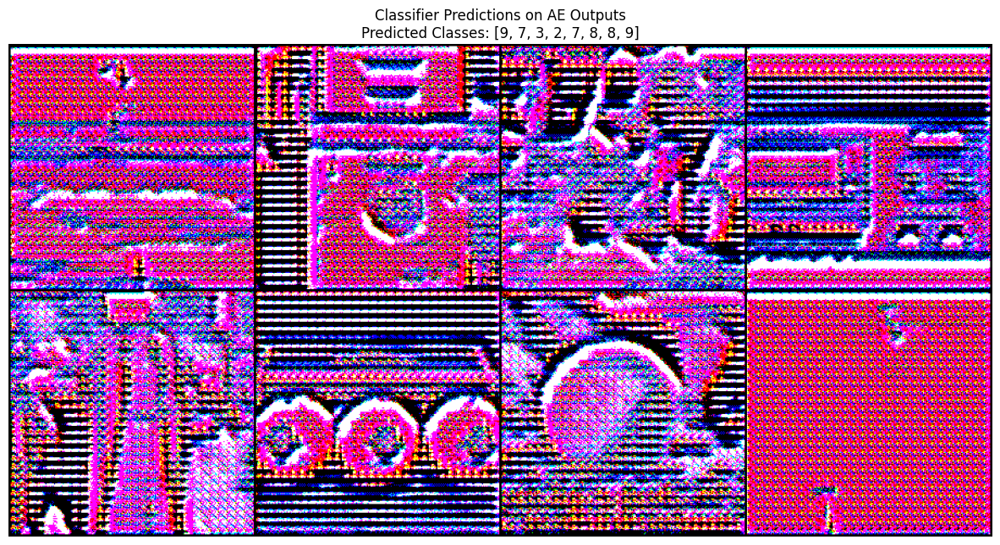

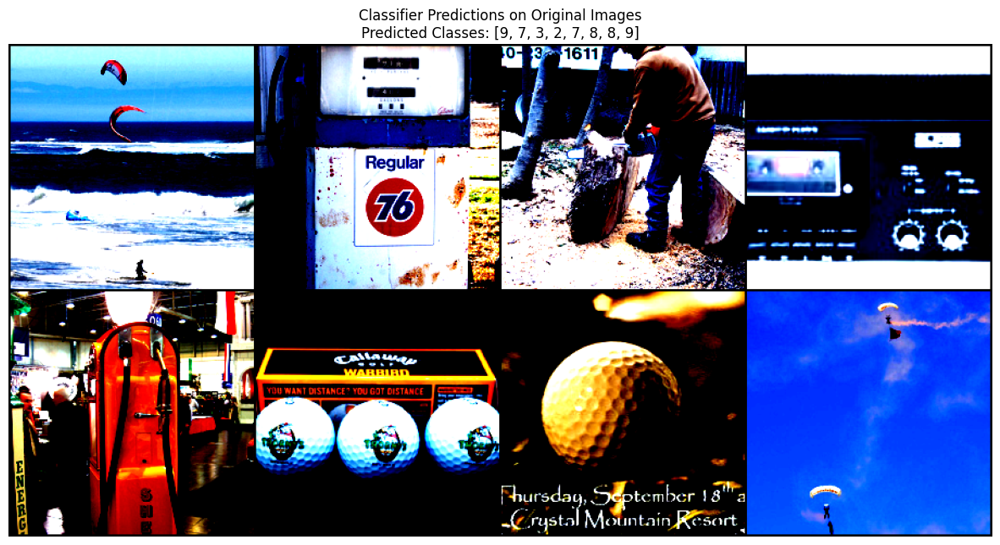

In [53]:
display_random_images(train_dataset, gen.to('cpu'), model_clf.to('cpu'))

In [54]:
gen = Generator().to(device)
gen.load_state_dict(torch.load('gen_5_3.pth'))

<All keys matched successfully>

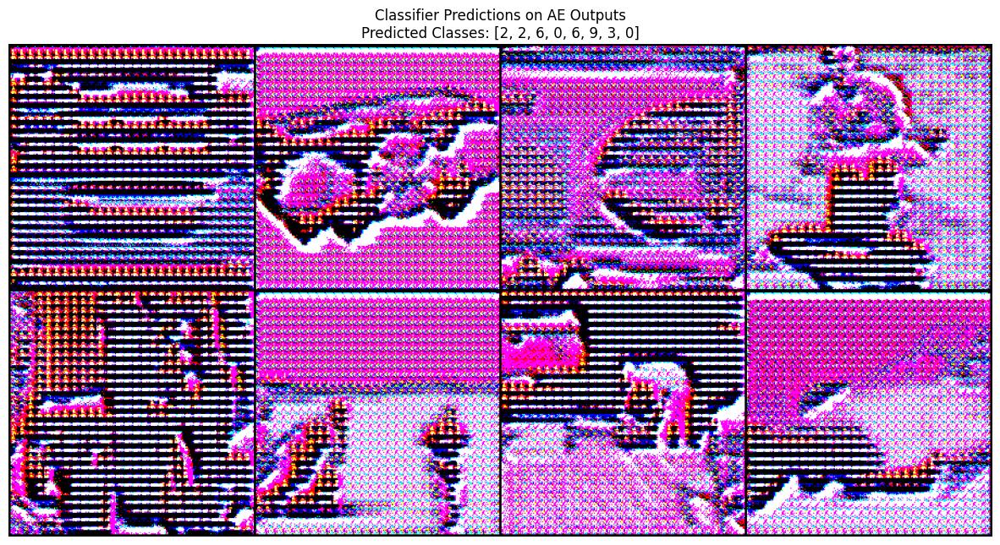

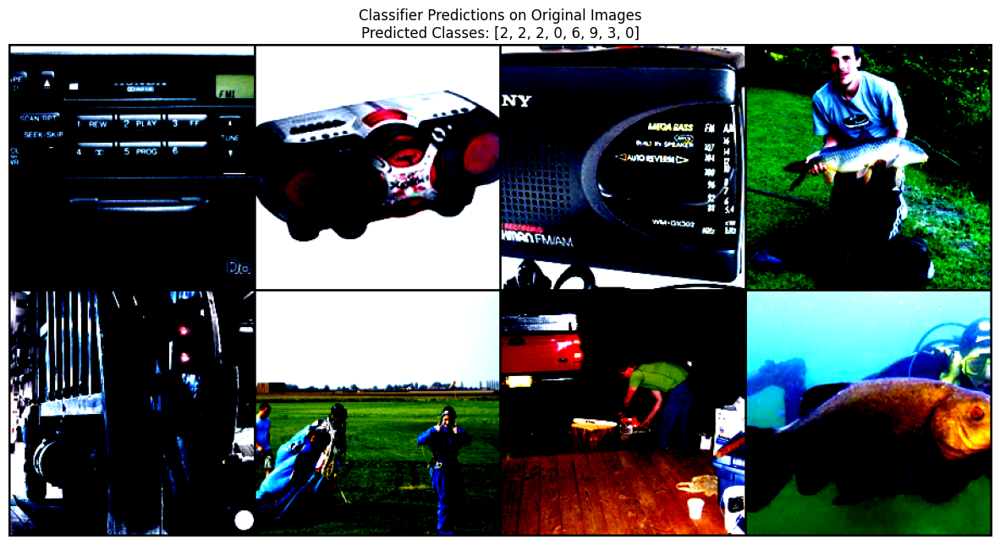

In [56]:
display_random_images(train_dataset, gen.to('cpu'), model_clf.to('cpu'))

In [57]:
gen = Generator().to(device)
gen.load_state_dict(torch.load('gen_5_2.pth'))

<All keys matched successfully>

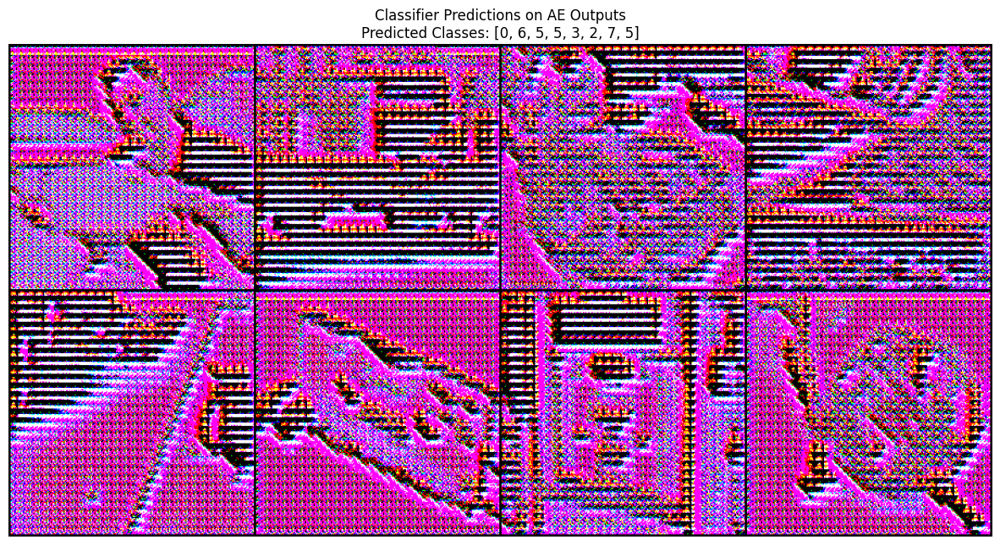

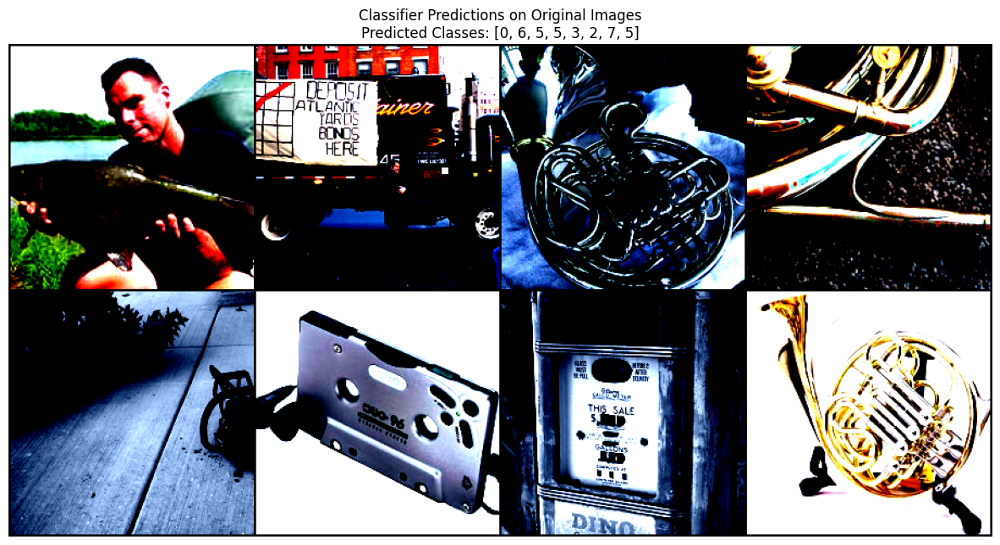

In [58]:
display_random_images(train_dataset, gen.to('cpu'), model_clf.to('cpu'))

In [59]:
gen = Generator().to(device)
gen.load_state_dict(torch.load('gen_5_1.pth'))

<All keys matched successfully>

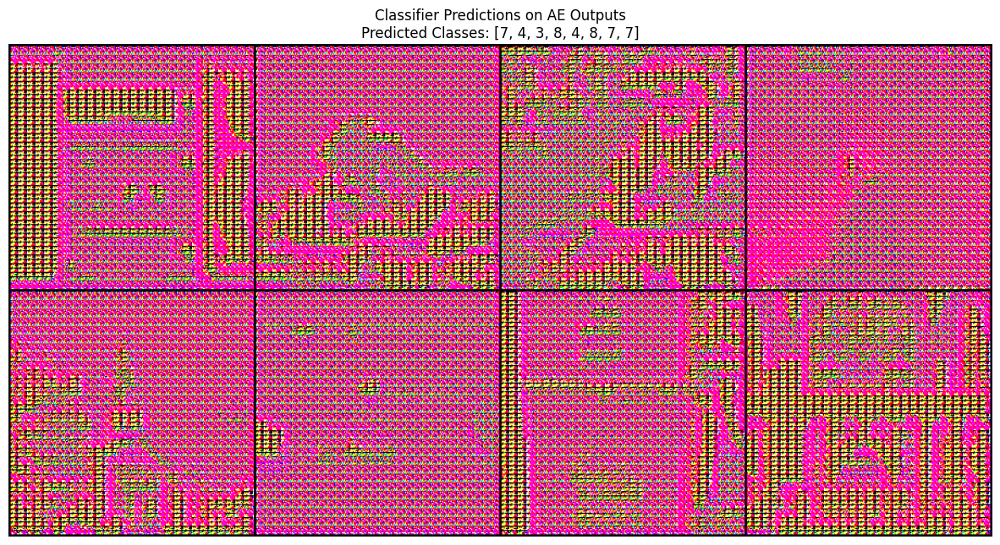

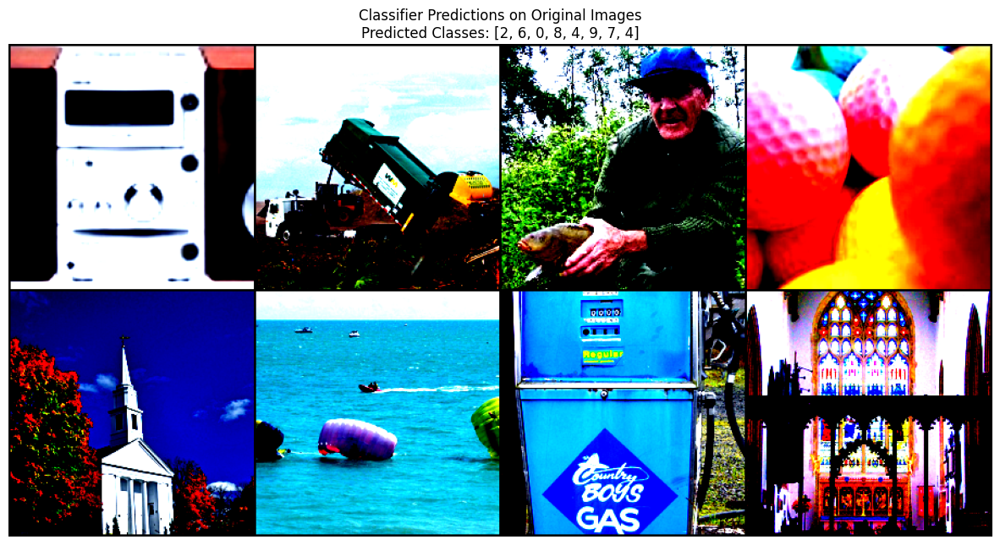

In [60]:
display_random_images(train_dataset, gen.to('cpu'), model_clf.to('cpu'))